This notebook provides you with an environment to play around with our algorithm of constructing a coarse solution. 
Registration, alignment, back-projection and low-pass filtering are all illustrated with this small dataset with 
only 2 images.

In [1]:
import os
# Change GPU Index to yours
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import torch
from torch import nn
from torch.nn import functional as F

import dnnlib
import torchvision

from tqdm import tqdm
from copy import deepcopy

/home/kevin/anaconda3/envs/cogs/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from scene import SceneFromScratch
from scene.gaussian_model import BindableGaussianModel, GaussianModel

In [4]:
from utils.loss_utils import l1_loss, norm_xy, delta_xy, predict_hierarchical_correspondence
from gaussian_renderer import render, renderApprSurface

In [5]:
from torchvision.utils import draw_keypoints

In [6]:
from matplotlib import pyplot as plt

In [7]:
from IPython.display import clear_output

In [8]:
import numpy as np
from PIL import Image
from torchvision.utils import make_grid
@torch.no_grad()
def render_tensor(img: torch.Tensor, normalize: bool = False, nrow: int = 8) -> Image.Image:
    def process_dtype(img):
        if img.dtype == torch.uint8:
            img = img.to(torch.float32) / 255.
            if normalize:
                img = img * 2 - 1
        return img
    if type(img) == list:
        img = torch.cat([process_dtype(i) if len(i.shape) == 4 else process_dtype(i[None, ...]) for i in img], dim=0).expand(-1, 3, -1, -1)
    elif len(img.shape) == 3:
        img = process_dtype(img).expand(3, -1, -1)
    elif len(img.shape) == 4:
        img = process_dtype(img).expand(-1, 3, -1, -1)
    
    img = img.squeeze()
    
    if normalize:
        img = img / 2 + .5
    
    if len(img.shape) == 3:
        return Image.fromarray((img.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))
    elif len(img.shape) == 2:
        return Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))
    elif len(img.shape) == 4:
        return Image.fromarray((make_grid(img, nrow=nrow).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))

In [9]:
def render_depth(depth: torch.Tensor, inverse=False) -> Image.Image:
    if inverse:
        return (depth.max() - depth) / (depth.max() - depth.min() + 1e-5)
    else:
        return (depth - depth.min()) / (depth.max() - depth.min() + 1e-5)

In [10]:
def render_keypoints(image, kps, **kwargs):
    image = image.squeeze()
    assert len(image.shape) == 3
    kps = kps.reshape(-1, 2).clone()
    kps[:, 0] = (kps[:, 0] + 1) / 2 * image.shape[-1]
    kps[:, 1] = (kps[:, 1] + 1) / 2 * image.shape[-2]
    return draw_keypoints((image * 255.).to(torch.uint8), kps[None], **kwargs).to(torch.float32) / 255.

In [11]:
dataset = dnnlib.EasyDict(
    source_path='./demo/', model_path='', eval=False, llffhold=None, num_images=None, resolution=-1, data_device="cuda", 
    scale_and_shift_mode="mask"
)

In [12]:
pipe = dnnlib.EasyDict(convert_SHs_python=False, compute_cov3D_python=False, debug=False)

In [13]:
device = "cuda"

In [14]:
gaussians = BindableGaussianModel()
scene = SceneFromScratch(dataset, gaussians)

Reading camera 2/2
Num of Images: None
Loading Training Cameras


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.39it/s]


Loading Test Cameras


0it [00:00, ?it/s]


## Initialization of First Frame

In [15]:
train_cameras = scene.getTrainCameras()
for cam in train_cameras:
    cam.set_up_scale_and_shift()
bg_color = [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device="cuda")
add_opts = dnnlib.EasyDict(retain_percent=1., init_opacity=0.999, init_scale='distance', break_connection=True)

In [16]:
# Add the first frame
gaussians.add_frame(train_cameras[0], impose_mask=None, **add_opts)
train_cameras[0].cam_requires_grad_(False)
train_cameras[0].scales_and_shifts_requires_grad_(False)

In [17]:
with torch.no_grad():
    render_pkg = renderApprSurface(train_cameras[0], gaussians, pipe, background)

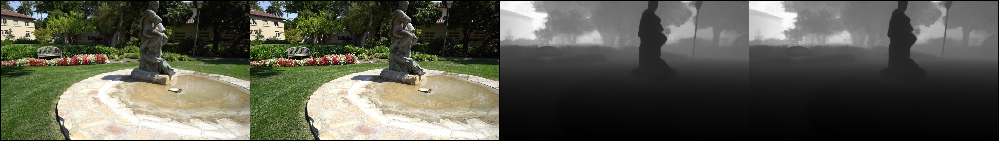

In [18]:
# As you can see, with back-projection, we can render exactly the same image 
# and same depth.
render_tensor([
    render_pkg["render"].clamp(0., 1.), train_cameras[0].image, 
    render_depth(render_pkg["depth"]).expand(3, -1, -1), render_depth(train_cameras[0].depth).expand(3, -1, -1)
], nrow=4)

## Register Second Frame

In [19]:
def parameters_cam_quaternion(train_cameras):
    return [cam.quaternion for cam in train_cameras]

def parameters_cam_T(train_cameras):
    return [cam.T for cam in train_cameras]

def parameters_cam_scale(train_cameras):
    return sum([cam.parameters_scale for cam in train_cameras], [])

def parameters_cam_shift(train_cameras):
    return sum([cam.parameters_shift for cam in train_cameras], [])

In [20]:
prev_cam = train_cameras[0]
next_cam = train_cameras[1]

In [21]:
optimizer = torch.optim.Adam([
        {"params": parameters_cam_quaternion(train_cameras), "lr": 1e-2}, 
        {"params": parameters_cam_T(train_cameras), "lr": 1e-1}, 
        {"params": parameters_cam_scale(train_cameras), "lr": 1e-2}, 
        {"params": parameters_cam_shift(train_cameras), "lr": 1e-1}
    ], lr=0.0)
next_cam.init_(prev_cam)
next_cam.cam_requires_grad_(True)

199


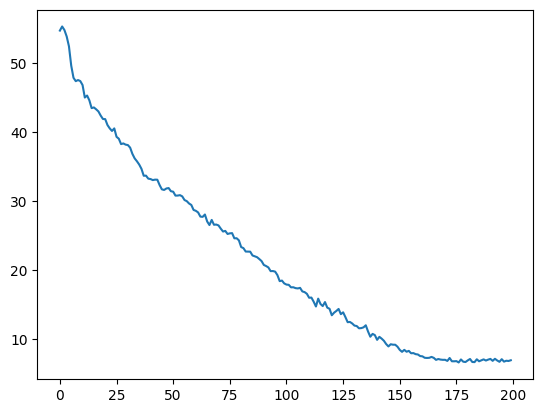

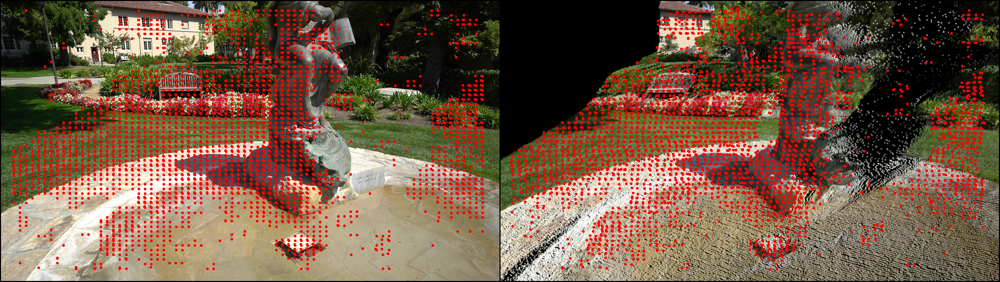

In [22]:
loss_s = []
for step in range(200):
    render_pkg = renderApprSurface(next_cam, gaussians, pipe, background)
    
    kp0, kp1, conf = predict_hierarchical_correspondence(
        next_cam.image, 
        render_pkg["render"].clamp(0., 1.), 
        threshold=0., 
        returns_conf=True
    )
    
    xy0 = kp0 / 2 + .5
    xy1 = torch.nn.functional.grid_sample(norm_xy(render_pkg["xy"])[None], kp1[None, None], mode='bilinear', align_corners=True).reshape(2, -1).permute(1, 0)
    
    loss_2d = ((xy0 - xy1).abs() * conf[:, None]).mean()
    loss_l1 = torch.nn.L1Loss()(render_pkg["render"], next_cam.image)
    loss = 1e3 * loss_2d + 1e1 * loss_l1
    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    loss_s.append(float(loss))
    if step == 0 or (step + 1) % 10 == 0:
        clear_output(wait=True)
        print(step)
        plt.plot(loss_s)
        plt.show()
        display(render_tensor([
            render_keypoints(next_cam.image, kp0, colors='red'), 
            render_keypoints(render_pkg["render"].clamp(0., 1.), kp1, colors='red')
        ]))

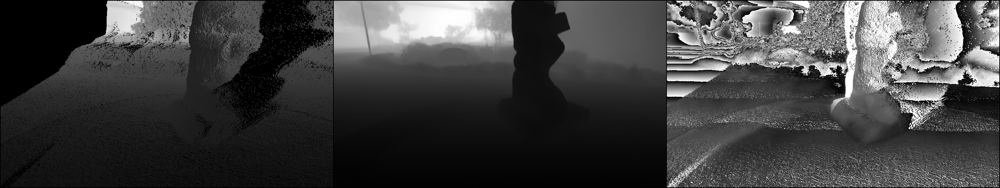

In [23]:
# Registration produces roughly accurate camera, while the 
# geometry is not exactly accurate. Meanwhile, the geometry 
# of the scene is different from the monocular depth.
render_tensor([render_depth(render_pkg["depth"]), render_depth(next_cam.depth), ((render_pkg["depth"] - next_cam.depth) / 1e1).clamp_max(1.)])

## Align Second Frame

In [24]:
next_cam.cam_requires_grad_(True)
prev_cam.scales_and_shifts_requires_grad_(True)
next_cam.scales_and_shifts_requires_grad_(True)

In [25]:
optimizer = torch.optim.Adam([
    {"params": [next_cam.quaternion], "lr": 1e-2}, 
    {"params": [next_cam.T], "lr": 1e-1}, 
    {"params": prev_cam.parameters_scale + next_cam.parameters_scale, "lr": 1e-1}, 
    {"params": prev_cam.parameters_shift + next_cam.parameters_shift, "lr": 1e-2}
], lr=0.0)

199


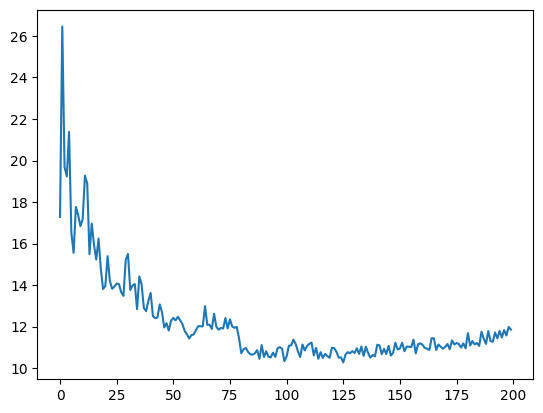

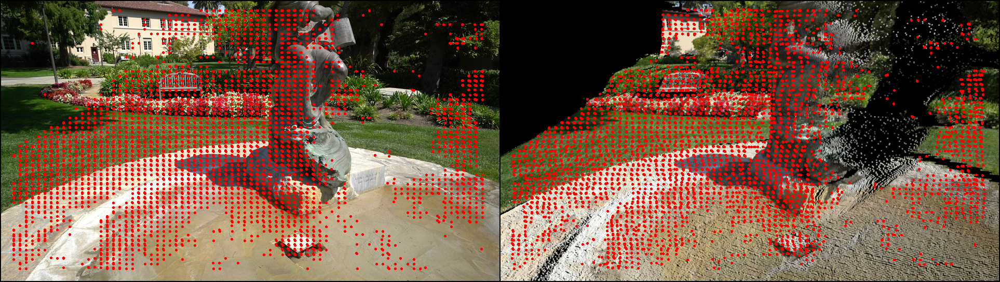

In [26]:
loss_s = []
for step in range(200):
    render_pkg = renderApprSurface(next_cam, gaussians, pipe, background)
    
    kp0, kp1, conf = predict_hierarchical_correspondence(
        next_cam.image, 
        render_pkg["render"].clamp(0., 1.), 
        threshold=0., 
        returns_conf=True
    )
    
    xy0 = kp0 / 2 + .5
    xy1 = torch.nn.functional.grid_sample(norm_xy(render_pkg["xy"])[None], kp1[None, None], mode='bilinear', align_corners=True).reshape(2, -1).permute(1, 0)
    
    hole_mask = delta_xy(render_pkg["xy"]).detach().squeeze()[None, None]
    depth0 = torch.nn.functional.grid_sample(next_cam.depth[None] * (~hole_mask), kp0[None, None], mode='bilinear', align_corners=False).squeeze()
    depth1 = torch.nn.functional.grid_sample(render_pkg["depth"][None] * (~hole_mask), kp1[None, None], mode='bilinear', align_corners=False).squeeze()
    
    loss_2d = ((xy0 - xy1).abs() * conf[:, None]).mean()
    loss_l1 = torch.nn.L1Loss()(render_pkg["render"], next_cam.image)
    loss_depth = torch.nn.L1Loss()(depth0, depth1.detach())
    loss = 1e3 * loss_2d + 1e1 * loss_l1 + loss_depth
    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    loss_s.append(float(loss))
    if step == 0 or (step + 1) % 10 == 0:
        clear_output(wait=True)
        print(step)
        plt.plot(loss_s)
        plt.show()
        display(render_tensor([
            render_keypoints(next_cam.image, kp0, colors='red'), 
            render_keypoints(render_pkg["render"].clamp(0., 1.), kp1, colors='red')
        ]))

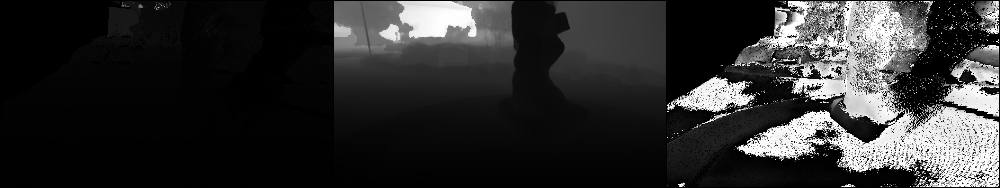

In [27]:
# Alignment further aligns the geometry of scene with newly 
# observed view. The monocular depth is aligned as well.
render_tensor([render_depth(render_pkg["depth"]), render_depth(next_cam.depth), (~hole_mask) * ((render_pkg["depth"] - next_cam.depth) / 1e1).clamp_max(1.)])

## Back-project Second Frame

In [28]:
with torch.no_grad():
    render_pkg = renderApprSurface(next_cam, gaussians, pipe, background)
    # Only project to previously empty regions
    impose_mask = delta_xy(render_pkg["xy"]).detach().squeeze()[None]
    impose_mask = torch.logical_and(impose_mask, render_pkg["depth"] <= 1e-3)

    hole_mask = delta_xy(render_pkg["xy"]).detach().squeeze()[None, None]
    depth_diff_mask = ((render_pkg["depth"].squeeze() - next_cam.depth.squeeze()) * (~hole_mask.squeeze())).squeeze().reshape_as(impose_mask)
    
    # Additionally, project to regions which are unseen in previous frames, 
    # but overlap with certain observed regions.
    impose_mask = torch.logical_or(impose_mask, depth_diff_mask > 10.)
    # Dilate impose_mask
    impose_mask = (torch.nn.functional.conv2d(impose_mask.float()[None], torch.ones(1, 1, 5, 5, device=device), padding='same') == 25)[0]

In [29]:
gaussians.add_frame(next_cam, **add_opts, impose_mask=impose_mask)

In [30]:
with torch.no_grad():
    render_pkg = renderApprSurface(next_cam, gaussians, pipe, background)

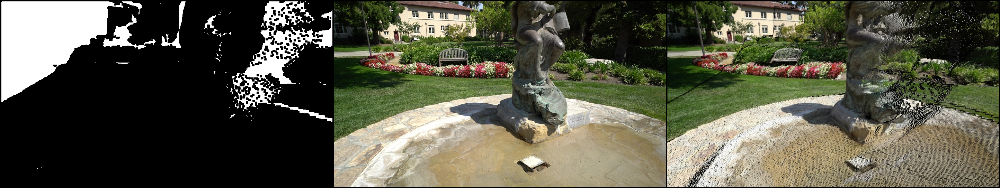

In [31]:
# We only back-project at regions where new content needs to be added.
render_tensor([impose_mask.expand(3, -1, -1), next_cam.image, render_pkg["render"].clamp(0., 1.)])

## Apply Low-pass Filter

In [32]:
export_pc = gaussians.export(0.1)

In [33]:
gaussians = GaussianModel(0)
gaussians.create_from_pcd(export_pc, 0.)

Number of points at initialisation :  56787


In [34]:
with torch.no_grad():
    render_pkg0 = renderApprSurface(prev_cam, gaussians, pipe, background)
    render_pkg1 = renderApprSurface(next_cam, gaussians, pipe, background)

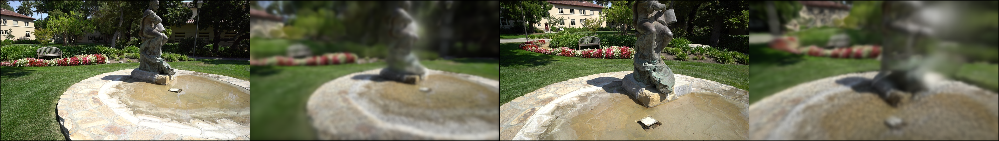

In [35]:
render_tensor([
    prev_cam.image, render_pkg0["render"].clamp(0., 1.), 
    next_cam.image, render_pkg1["render"].clamp(0., 1.)
])